In [1]:
import shared_methods as shared_methods
import importlib
importlib.reload(shared_methods)
from shared_methods import Config

from IPython.display import Markdown

In [2]:

config = Config({'expiration': '30DEC22',
        'strikes' : [
            '5000', '10000', '12000', '14000', '15000', '16000', '17000',
           '18000', '19000', '20000', '21000', '22000', '23000', '24000',
           '25000', '26000', '27000', '28000', '30000', '32000', '34000',
           '35000', '36000', '38000', '40000', '45000', '50000', '55000',
           '60000', '70000', '80000', '90000', '100000', '120000', '150000',
           '200000', '250000', '300000'
        ]
         })

In [3]:
display(Markdown(f'## Expiration: **{config.expiration}**'))

## Expiration: **30DEC22**

In [4]:
display(Markdown(f'### Strikes {config.strikes}'))

### Strikes ['5000', '10000', '12000', '14000', '15000', '16000', '17000', '18000', '19000', '20000', '21000', '22000', '23000', '24000', '25000', '26000', '27000', '28000', '30000', '32000', '34000', '35000', '36000', '38000', '40000', '45000', '50000', '55000', '60000', '70000', '80000', '90000', '100000', '120000', '150000', '200000', '250000', '300000']

In [5]:
merged_df = shared_methods.getMergedDataframe(config)

startDate = merged_df.iloc[-1]['timestamp'].strftime('%Y-%m-%d')
startPrice = merged_df.iloc[-1]['btc_usd']

endDate = merged_df.iloc[0]['timestamp'].strftime('%Y-%m-%d')
endPrice = merged_df.iloc[0]['btc_usd']


"These strikes don't have any data:"

[]

In [6]:
display(Markdown(f'## Start price at {startDate}: **{startPrice}**'))

## Start price at 2021-12-30: **47150.71**

In [21]:
display(Markdown(f'## End price at {endDate}: **{endPrice}**'))

## End price at 2022-12-30: **16603.0**

In [44]:
display(Markdown(f'## BTC PnL at {endDate}: **{((endPrice / (startPrice / 100)) - 100).round(2)} %**'))

## BTC PnL at 2022-12-30: **-64.79 %**

In [8]:
def filter(df):
    #pd.set_option('display.width', 1000)
    with pd.option_context('display.max_rows', None, 'display.max_columns', None):
        strike = 5000
        month = 1
        year = 2023
        result = df.loc[(pd.to_datetime(df['timestamp']).dt.month == month) 
                        & (pd.to_datetime(df['timestamp']).dt.year == year)

                       ]
        result = result.dropna(axis=1, how='all')
#        result = result.loc[:, ['timestamp', 'btc_usd', f'option_{strike}_usd']]

        display(result)

In [9]:

#with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#    display(merged_df)
#    display(merged_df.loc[:, ['timestamp', 'btc_usd', f'option_5000_usd']].dropna(axis=1, how='all'))
#filter(merged_df)
#display(merged_df)

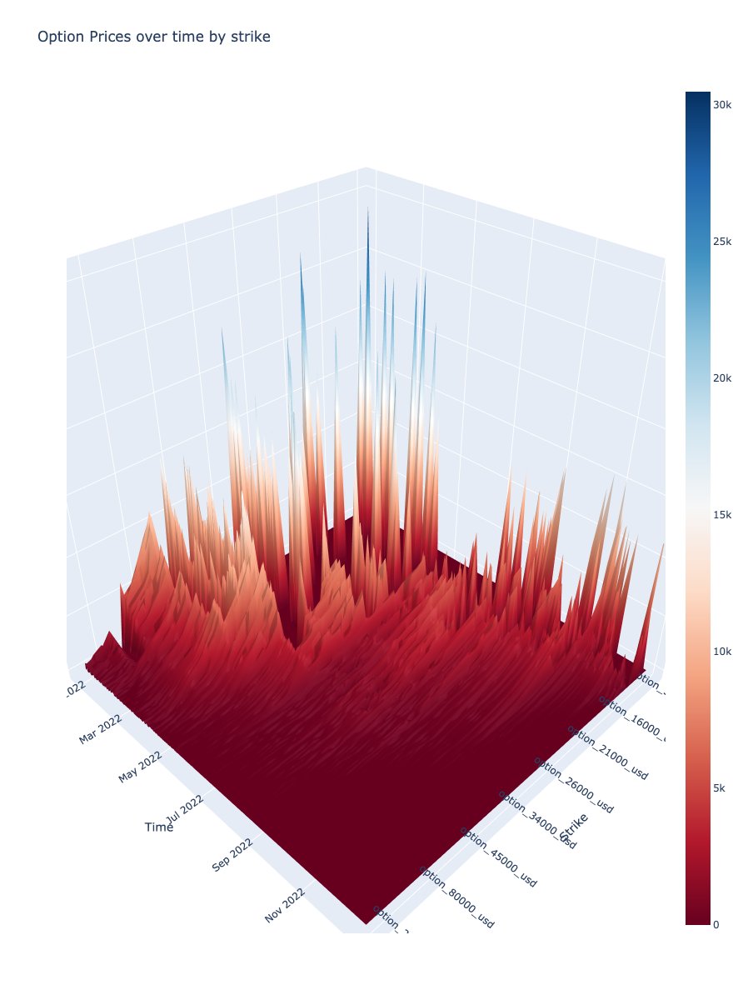

In [10]:


shared_methods.plotSurface(merged_df)

* At the beginning only the out of the money options have been traded.


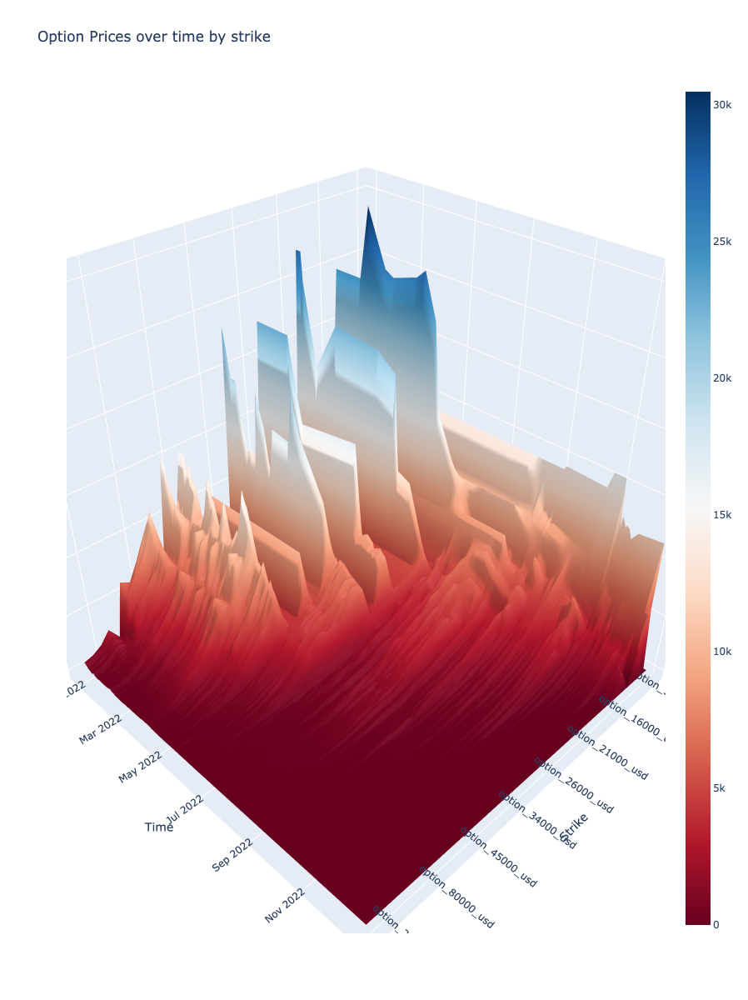

In [11]:
shared_methods.plotSurface(merged_df.interpolate(method='linear')) #cubic vs linear

* Obviously options with a lower strike have more intrinsic value and thus are more pricy.
* As the BTC price declines the option prices decline.
* Soon before expiration the atm options increase the most in fixed dollar terms (not percentage wise)
* Soon before expiration the out of the money options go to zero.
* The options that are way in the money don't move much.

### Show the Plain prices of BTC and the Options

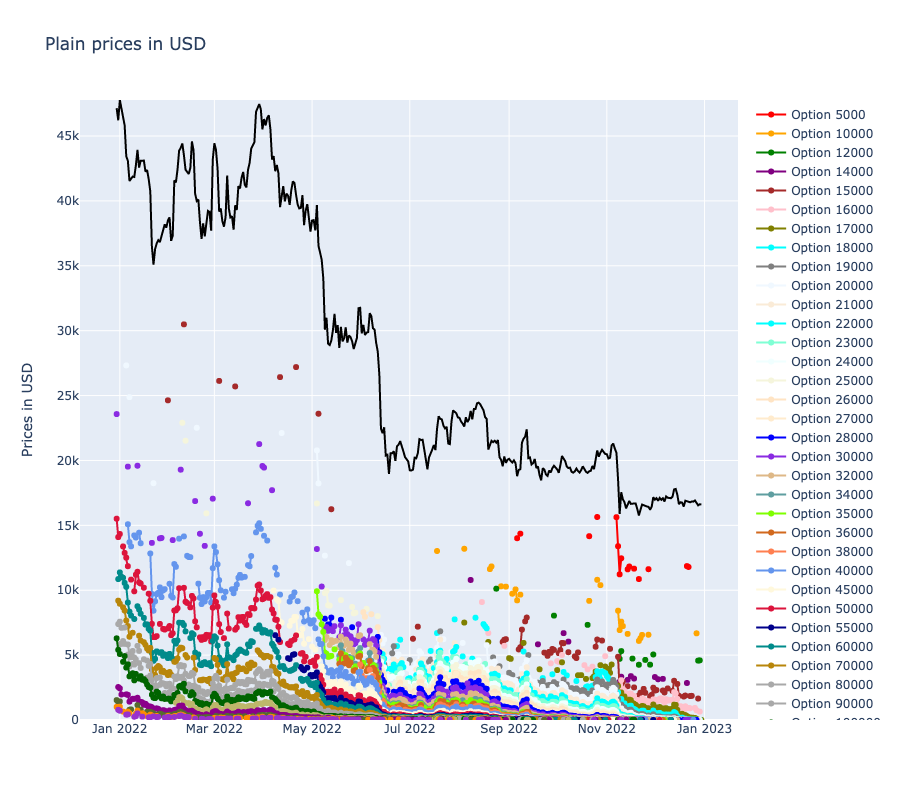

In [12]:

shared_methods.showPlainPriceChart(merged_df, config.strikes)

In [13]:
shared_methods.getTradingViewWidget("Bitstamp:BTCUSD")


### Move the lines up to the same startpoint of BTC to roughly visualize the delta

In [14]:

df_shifted = shared_methods.shiftLinesToTheStartOfBTC(merged_df, config.strikes)
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#    display(df_shifted)

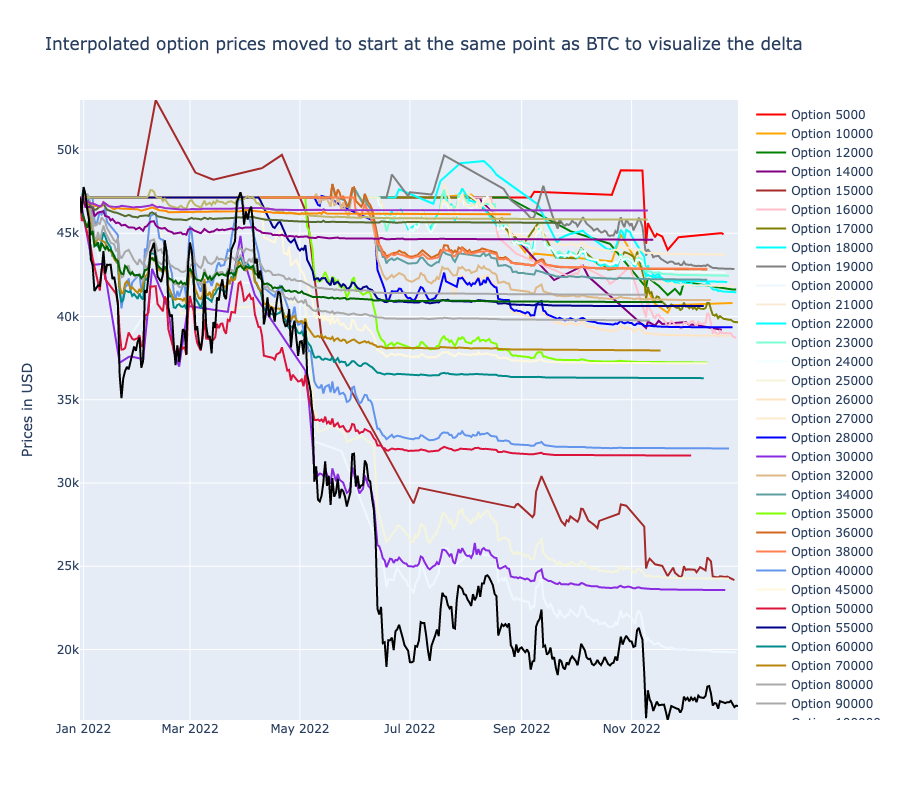

In [15]:
shared_methods.showOffsettedPriceChart(df_shifted, config.strikes)

The more the option is in the money the more it follows the price movements of BTC (=higher delta). But it's interpolated which distorts the picture as there aren't always trades while the line doesn't really show that.

In [16]:
dfPricesChangedUSD = shared_methods.getPriceChanges(merged_df, config.strikes)
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#    display(dfPricesChangedUSD)

### Absolute changes in USD compared to previous day. The Delta.

Disable the BTC plot in the legend of the chart if it overlays the other plots too much!

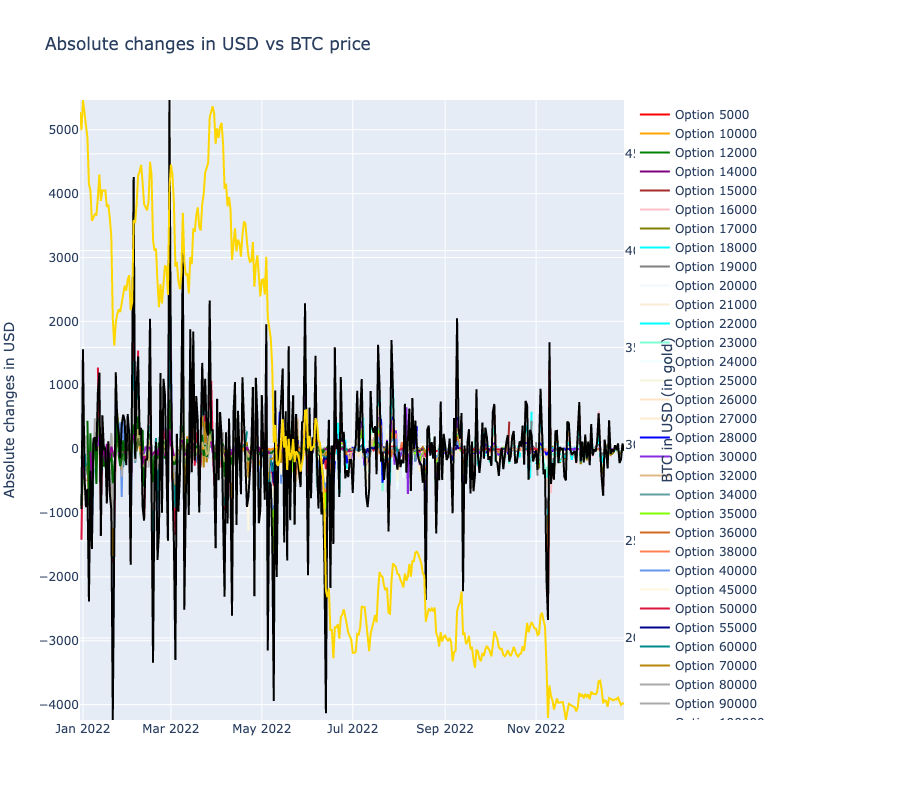

In [17]:
shared_methods.plotOptionPricesChangedUSD(dfPricesChangedUSD, config.strikes)


### Percent changes compared to previous data point relative to the BTC price

#### The out of the money options fluctuate more than the options that are more in the money.

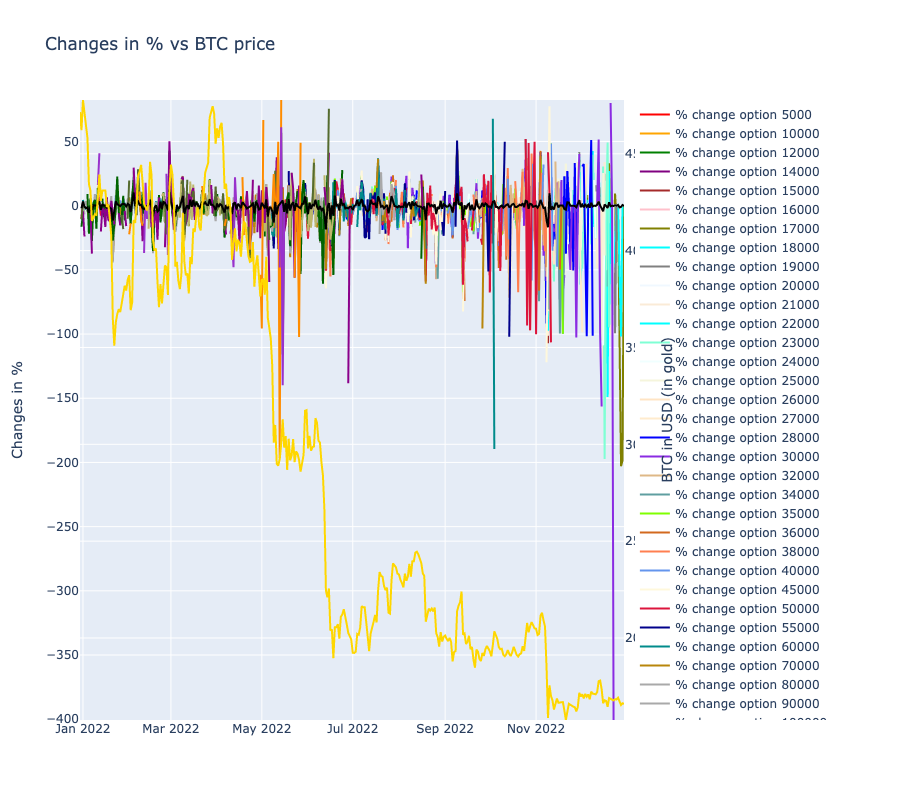

In [18]:
display(Markdown('#### The out of the money options fluctuate more than the options that are more in the money.'))
shared_methods.plotOptionPricesChangedPercent(dfPricesChangedUSD, config.strikes)

## Price increase in %

In [19]:

interpolated_df = merged_df.interpolate(method='linear') # or cubic
df_percent_all = shared_methods.calcGains(interpolated_df, config.strikes)

#with pd.option_context('display.max_rows', None):
#    display(df_percent_all)
df_percent_all

,timestamp,btc_usd,btc_percent_all,option_5000_usd,option_5000_percent_all,option_10000_usd,option_10000_percent_all,option_12000_usd,option_12000_percent_all,option_14000_usd,...,option_120000_usd,option_120000_percent_all,option_150000_usd,option_150000_percent_all,option_200000_usd,option_200000_percent_all,option_250000_usd,option_250000_percent_all,option_300000_usd,option_300000_percent_all
106,2022-12-30,16603.00,-64.787381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28,2022-12-29,16628.00,-64.734359,NaN,NaN,NaN,NaN,4597.6400,-54.567159,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29,2022-12-28,16540.00,-64.920995,NaN,NaN,NaN,NaN,4573.3100,-54.807582,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,2022-12-27,16700.00,-64.581657,NaN,NaN,6680.00,-48.708262,4590.2625,-54.640061,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,2022-12-26,16917.00,-64.121431,NaN,NaN,6676.32,-48.736519,4607.2150,-54.472541,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
351,2022-01-03,46439.89,-1.507549,14007.2,0.0,13023.54,0.000000,10119.6400,0.000000,10791.22,...,1325.69,0.0,1968.796667,-22.542906,1218.606667,-20.477247,650.160,-35.865212,564.650,-28.128659
360,2022-01-02,47350.22,0.423133,14007.2,0.0,13023.54,0.000000,10119.6400,0.000000,10791.22,...,1325.69,0.0,1965.030000,-22.691096,1325.963333,-13.471461,838.685,-17.268234,640.655,-18.454381
352,2022-01-01,47777.42,1.329163,14007.2,0.0,13023.54,0.000000,10119.6400,0.000000,10791.22,...,1325.69,0.0,2436.650000,-4.136455,1433.320000,-6.465675,1027.210,1.328743,716.660,-8.780103
353,2021-12-31,46214.37,-1.985845,14007.2,0.0,13023.54,0.000000,10119.6400,0.000000,10791.22,...,1325.69,0.0,2541.790000,0.000000,1386.430000,-9.525581,1020.475,0.664372,785.640,0.000000


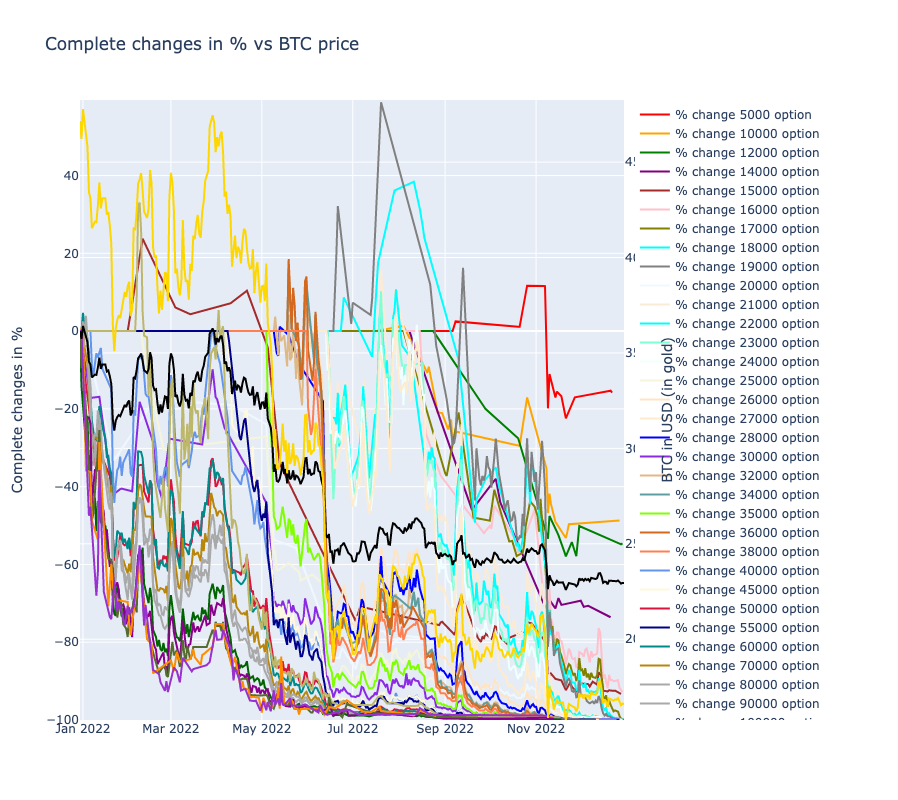

In [20]:
shared_methods.plotOptionPricesChangedPercentAll(df_percent_all, config.strikes)

The OOTM options went to zero pretty soon and even the options that where still ITM at expiration lost a significant amount or most of its value.